# LMSYS - Chatbot Arena: Advanced EDA & Feature Engineering
## 1. Imports & Configuration

## Environment Setup
Installing necessary libraries for NLP features and Clustering

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ast
import re
import emoji
import textstat
from textblob import TextBlob
from collections import Counter
from sentence_transformers import SentenceTransformer, util
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import umap
import hdbscan
import plotly.express as px
from wordcloud import WordCloud
import logging
import os

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# 设置绘图风格
sns.set_style("whitegrid")
# plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['font.sans-serif'] = ['DejaVu Sans'] 
plt.rcParams['axes.unicode_minus'] = False

# 屏蔽警告
import warnings
warnings.filterwarnings('ignore')
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

print("Libraries loaded.")

2025-11-26 03:50:19.034176: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764129019.229949      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764129019.289057      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Libraries loaded.


## 2. Data Cleaning Utilities
解析列表格式并修复 Unicode 编码问题。

In [4]:
def process_text_list(text_str):
    """解析 CSV 字符串列表格式，处理转义字符"""
    if pd.isna(text_str): return ""
    text_str = str(text_str)
    try:
        clean_str = text_str.replace(r'\/', '/')
        parsed = ast.literal_eval(clean_str)
        if isinstance(parsed, list):
            return " ".join([str(x) for x in parsed if x is not None])
    except:
        pass
    text_str = text_str.strip()
    if text_str.startswith('[') and text_str.endswith(']'):
        text_str = text_str[1:-1]
    return text_str

def fix_unicode(text):
    """修复损坏的 Unicode 编码，保留 Emoji"""
    if text is None: return ""
    text = str(text)
    try:
        return text.encode('utf-8', 'ignore').decode('utf-8')
    except:
        return ""

def load_and_clean_data(filepath):
    print(f"Loading data from {filepath}...")
    df = pd.read_csv(filepath)
    
    # 1. 解析与修复
    print("Parsing and fixing unicode...")
    cols = ['prompt', 'response_a', 'response_b']
    new_cols = ['prompt_text', 'res_a_text', 'res_b_text']
    
    for c, new_c in zip(cols, new_cols):
        df[new_c] = df[c].apply(process_text_list).apply(fix_unicode)
        
    # 2. 生成 Target Label
    def get_winner(row):
        if row['winner_model_a'] == 1: return 'Model A Win'
        if row['winner_model_b'] == 1: return 'Model B Win'
        return 'Tie'
    
    if 'winner_model_a' in df.columns:
        df['winner'] = df.apply(get_winner, axis=1)
        
    print(f"Data Loaded: {df.shape}")
    return df

# --- Load Data ---
# train_df = load_and_clean_data('train.csv')
train_df = load_and_clean_data('/kaggle/input/raw-train/train.csv')

Loading data from /kaggle/input/raw-train/train.csv...
Parsing and fixing unicode...
Data Loaded: (57477, 13)


## 3. Basic Data Analysis
分析数据集形状、目标分布和长度统计/异常值。

📊 BASIC DATA ANALYSIS REPORT

1️⃣ Dataset Shape: (57477, 13)

2️⃣ Missing Values: 0

3️⃣ Label Distribution:
winner
Model A Win    20064
Model B Win    19652
Tie            17761
Name: count, dtype: int64


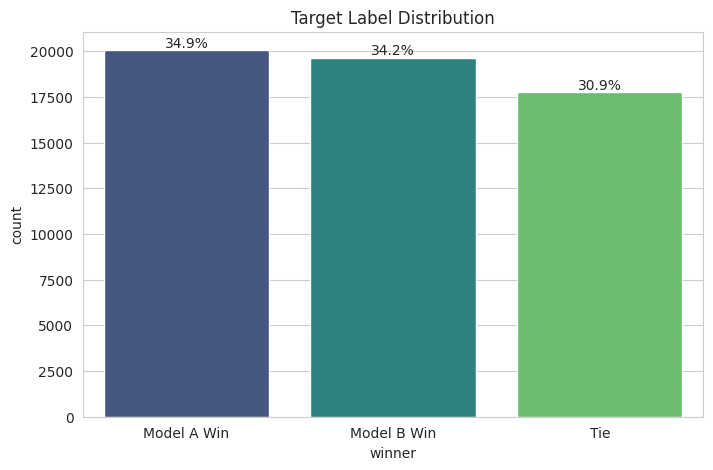


4️⃣ Length Statistics (Character Count)
       len_prompt  total_len
count     57477.0    57477.0
mean        352.0     1683.0
std        1025.0     1928.0
min           3.0        3.0
25%          48.0      548.0
50%          91.0     1265.0
75%         233.0     2114.0
max       32833.0    60725.0

⚠️ Outlier Threshold (99%): 9800 chars


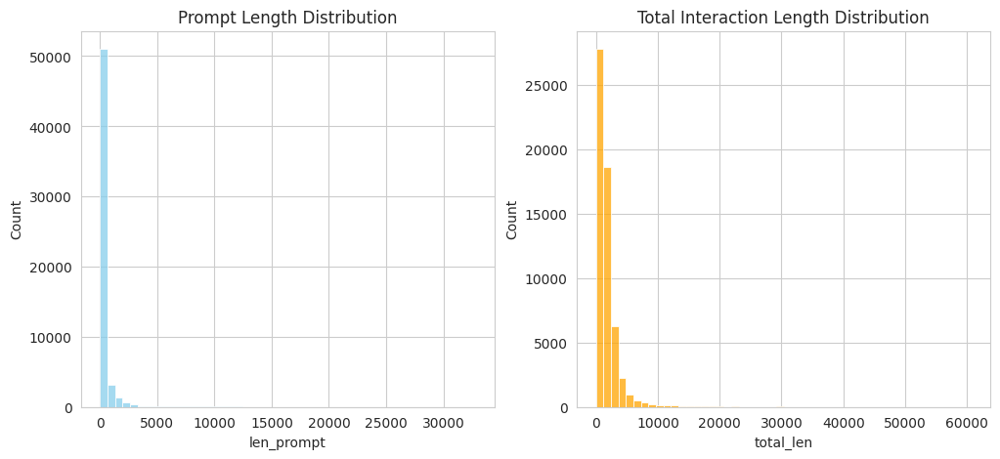

In [5]:
def perform_basic_analysis(df):
    print("="*50)
    print("📊 BASIC DATA ANALYSIS REPORT")
    print("="*50)

    # 1. 数据集概况
    print(f"\n1️⃣ Dataset Shape: {df.shape}")
    
    # 2. 检查缺失值
    missing = df.isnull().sum().sum()
    print(f"\n2️⃣ Missing Values: {missing}")

    # 3. 标签分布
    if 'winner' in df.columns:
        winner_counts = df['winner'].value_counts()
        print(f"\n3️⃣ Label Distribution:\n{winner_counts}")
        
        plt.figure(figsize=(8, 5))
        ax = sns.countplot(x='winner', data=df, order=['Model A Win', 'Model B Win', 'Tie'], palette='viridis')
        plt.title('Target Label Distribution')
        total = len(df)
        for p in ax.patches:
            percentage = f'{100 * p.get_height() / total:.1f}%'
            ax.annotate(percentage, (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
        plt.show()

    # 4. 长度统计
    # 简单估算字符长度
    df['len_prompt'] = df['prompt_text'].apply(len)
    df['total_len'] = df['len_prompt'] + df['res_a_text'].apply(len)
    
    print("\n4️⃣ Length Statistics (Character Count)")
    print(df[['len_prompt', 'total_len']].describe().round(0))
    
    # 异常值检测 (99分位)
    q99 = df['total_len'].quantile(0.99)
    print(f"\n⚠️ Outlier Threshold (99%): {q99:.0f} chars")
    
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    sns.histplot(df['len_prompt'], bins=50, color='skyblue')
    plt.title('Prompt Length Distribution')
    
    plt.subplot(1, 2, 2)
    sns.histplot(df['total_len'], bins=50, color='orange')
    plt.title('Total Interaction Length Distribution')
    plt.show()

# --- Execution ---
perform_basic_analysis(train_df)

### 类别分布
- 可以抽象成a_win，b_win，tie三分类问题，类别非常平衡。不需要做下采样或过采样（Resampling），直接用 Cross Entropy Loss 训练即可。Tie 的比例很高，说明模型必须具备“判断不出差异时敢于选平局”的能力。

### 长度统计
- 99% 的数据总长度在 9800 字符以内。
- 一般 1 token ≈ 3-4 chars，所以 9800 chars ≈ 2500-3000 tokens。
- 微调建议: 在后续微调模型时，设置 max_seq_length = 2048 或 2560 能够覆盖绝大多数样本，性价比最高。V100 显存有限，不要设太大。

## 4. Clustering Pipeline (Feature: Cluster ID)
使用 MPNet + UMAP + kmeans 生成 cluster_id。这个 ID 将作为一个重要的 Categorical Feature。

In [6]:
def generate_cluster_features(df, debug=False):
    print("="*50)
    print(f"🚀 Running Clustering Pipeline (MPNet + Multi-K Means) | Debug: {debug}")
    print("="*50)
    
    # Debug 模式采样
    if debug:
        print("⚠️ DEBUG MODE: Sampling 1000 rows.")
        df = df.head(1000).copy()
    
    # 1. 构造文本
    texts = ("PROMPT: " + df['prompt_text'].str.slice(0, 300) + 
             " RESPONSE: " + df['res_a_text'].str.slice(0, 300)).tolist()
    
    # 2. Encoding
    print(f"Encoding {len(texts)} samples...")
    model = SentenceTransformer('all-mpnet-base-v2')
    embeddings = model.encode(texts, batch_size=64, show_progress_bar=True)
    
    # 3. UMAP 降维
    print("Running UMAP...")
    # n_neighbors=15 让结构更紧凑，适合聚类
    umap_reducer = umap.UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42)
    umap_emb = umap_reducer.fit_transform(embeddings)
    
    # 保存 UMAP 坐标用于可视化
    df['umap_x'] = umap_emb[:, 0]
    df['umap_y'] = umap_emb[:, 1]
    
    # 4. Multi-K KMeans
    # 我们生成 3 组聚类特征：粗粒度(10)，中粒度(20)，细粒度(50)
    k_list = [8, 12, 16, 20]
    if debug: k_list = [5, 10] # Debug模式少跑点
    
    for k in k_list:
        print(f"   -> Running KMeans (k={k})...")
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        # 在 UMAP 结果上跑 KMeans 速度快且边界清晰
        df[f'cluster_id_k{k}'] = kmeans.fit_predict(umap_emb)
        
    # 为了兼容后续代码，把 k=20 (或 debug 的 k=10) 设为默认的 'cluster_id'
    default_k = 20 if not debug else 10
    df['cluster_id'] = df[f'cluster_id_k{default_k}']
    
    print(f"✅ Clustering Done. Generated columns: {[f'cluster_id_k{k}' for k in k_list]}")
    return df, embeddings

train_df, embeddings = generate_cluster_features(train_df)

🚀 Running Clustering Pipeline (MPNet + Multi-K Means) | Debug: False
Encoding 57477 samples...


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/899 [00:00<?, ?it/s]

Running UMAP...
   -> Running KMeans (k=8)...
   -> Running KMeans (k=12)...
   -> Running KMeans (k=16)...
   -> Running KMeans (k=20)...
✅ Clustering Done. Generated columns: ['cluster_id_k8', 'cluster_id_k12', 'cluster_id_k16', 'cluster_id_k20']


## 5. Feature Engineering (The Mega Function)
这是核心部分。构造所有基础特征、高级特征以及成对差异特征 (Pairwise Features)。

In [7]:
def extract_all_features(df, embeddings):
    print("="*50)
    print("🛠 Feature Engineering Pipeline")
    print("="*50)

    # 清理重复列，防止 concat 导致的列膨胀
    df = df.loc[:, ~df.columns.duplicated()].copy()
    
    # --- A. Length Features (Length is King) ---
    print("1. Extracting Length Features...")
    df['len_p'] = df['prompt_text'].apply(len)
    df['len_a'] = df['res_a_text'].apply(len)
    df['len_b'] = df['res_b_text'].apply(len)
    
    df['len_sum'] = df['len_a'] + df['len_b']
    # Expansion Ratio (回答长度 / 提示词长度)
    df['expansion_a'] = df['len_a'] / df['len_p']
    df['expansion_b'] = df['len_b'] / df['len_p']
    df['expansion_diff'] = df['expansion_a'] - df['expansion_b']

    # Pairwise: Diff & Ratio
    df['len_diff'] = df['len_a'] - df['len_b']
    df['len_ratio'] = df['len_a'] / df['len_b']
    
    # --- B. Formatting Features (Markdown) ---
    print("2. Extracting Markdown/Formatting Features...")
    def check_fmt(text):
        return pd.Series({
            'has_code': 1 if '```' in text else 0,
            'has_bold': 1 if '**' in text else 0,
            'has_list': 1 if re.search(r'(^- |\d+\. )', text, re.MULTILINE) else 0,
            'has_latex': 1 if '$' in text else 0
        })
    
    fmt_a = df['res_a_text'].apply(check_fmt).add_suffix('_a')
    fmt_b = df['res_b_text'].apply(check_fmt).add_suffix('_b')
    df = pd.concat([df, fmt_a, fmt_b], axis=1)
    
    # Pairwise Formatting Diffs (关键特征)
    # 比如：A有加粗但B没有 -> bold_diff = 1
    df['bold_diff'] = df['has_bold_a'] - df['has_bold_b']
    df['code_diff'] = df['has_code_a'] - df['has_code_b']
    df['list_diff'] = df['has_list_a'] - df['has_list_b']
    
    # --- C. Style & Sentiment Features ---
    print("3. Extracting Style & Sentiment...")
    refusal_kws = ["i cannot", "as an ai", "unable to", "unethical", "dangerous", "unsafe", "i can't", "i cannot", "i'm not able to", "i won't", "i will not"]
    polite_kws = ['sorry', 'apologize', 'thank', 'please', "thanks", "pleasure", "welcome", "thx"]
    
    def get_style(text):
        t_lower = str(text).lower()
        return pd.Series({
            'is_refusal': 1 if any(k in t_lower for k in refusal_kws) else 0,
            'has_emoji': 1 if emoji.emoji_count(str(text)) > 0 else 0,
            'is_polite': 1 if any(k in t_lower for k in polite_kws) else 0,
            'has_disclaimer': 1 if 'as an ai' in t_lower or 'language model' in t_lower else 0,
            # TextBlob 简单情感分析
            'sentiment': TextBlob(str(text)[:500]).sentiment.polarity
        })

    style_a = df['res_a_text'].apply(get_style).add_suffix('_a')
    style_b = df['res_b_text'].apply(get_style).add_suffix('_b')
    df = pd.concat([df, style_a, style_b], axis=1)
    
    # Pairwise Style Diffs
    df['sentiment_gap'] = df['sentiment_a'] - df['sentiment_b']
    df['refusal_diff'] = df['is_refusal_a'] - df['is_refusal_b']
    
    # Double Refusal Flag (强Tie特征)
    df['both_refuse'] = df['is_refusal_a'] * df['is_refusal_b']

    # --- D. Readability ---
    print("4. Extracting Readability...")
    def get_readability(text):
        try: return textstat.flesch_kincaid_grade(text) if len(text) > 5 else 0
        except: return 0
            
    df['read_a'] = df['res_a_text'].apply(get_readability)
    df['read_b'] = df['res_b_text'].apply(get_readability)
    df['read_diff'] = df['read_a'] - df['read_b']
    
    # --- E. Task-Specific Interaction Features ---
    print("5. Interaction Features (Prompt x Response)...")
    # 检测 Prompt 是否是代码题
    code_kws = ['python', 'java', 'code', 'function', 'script', 'c++', 'html', 'error', 'html', 'golang']
    df['is_code_task'] = df['prompt_text'].apply(lambda x: 1 if any(k in str(x).lower() for k in code_kws) else 0)
    
    # 交互特征：是代码题 且 A使用了代码块
    df['code_task_x_has_code_a'] = df['is_code_task'] * df['has_code_a']
    df['code_task_x_has_code_b'] = df['is_code_task'] * df['has_code_b']
    
    # --- F. Embedding Similarity ---
    print("6. Calculating Cosine Similarity...")
    # 我们需要重新 encode 单独的 response 用于计算相似度
    # 注意：这里使用 sample 来演示，如果全量跑可能需要几分钟
    # 为了准确，我们这里使用已经存在的 embeddings (联合) 做近似，或者重新算
    # 鉴于之前已经算过联合embedding，这里简单计算 TF-IDF 相似度作为替代，或者重新跑 embedding
    # 这里为了完整性，重新计算轻量级相似度
    
    mini_model = SentenceTransformer('all-MiniLM-L6-v2')
    # 批处理计算
    emb_a = mini_model.encode(df['res_a_text'].tolist(), batch_size=128, show_progress_bar=True)
    emb_b = mini_model.encode(df['res_b_text'].tolist(), batch_size=128, show_progress_bar=True)
    
    df['cosine_sim'] = [util.cos_sim(a, b).item() for a, b in zip(emb_a, emb_b)]
    
    print("✅ All features extracted.")
    return df

# --- Run Feature Engineering ---
train_df = extract_all_features(train_df, embeddings)

🛠 Feature Engineering Pipeline
1. Extracting Length Features...
2. Extracting Markdown/Formatting Features...
3. Extracting Style & Sentiment...
4. Extracting Readability...
5. Interaction Features (Prompt x Response)...
6. Calculating Cosine Similarity...


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/450 [00:00<?, ?it/s]

Batches:   0%|          | 0/450 [00:00<?, ?it/s]

✅ All features extracted.


分析“扩写率”的影响(回复长度/提示词长度)


📊 Analyzing Prompt Expansion Ratio...
expansion_diff_bin
(-624.001, -5.452]    0.239976
(-5.452, -0.634]      0.285453
(-0.634, 0.644]       0.310048
(0.644, 5.441]        0.391475
(5.441, 640.667]      0.518441
Name: winner_model_a, dtype: float64


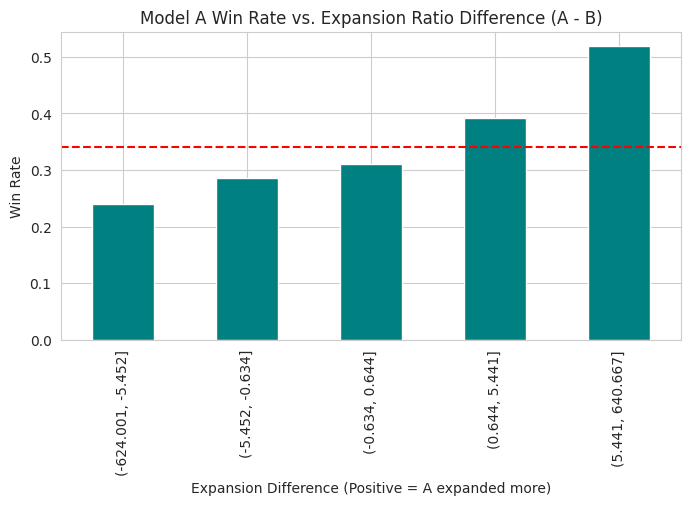

💡 Insight: Does expanding the prompt (writing more than the user asked) lead to higher win rates?


In [8]:
def analyze_expansion_ratio(df):
    print("\n📊 Analyzing Prompt Expansion Ratio...")
    # 计算胜率 Delta
    df['expansion_diff_bin'] = pd.qcut(df['expansion_diff'], q=5)
    
    win_rates = df.groupby('expansion_diff_bin')['winner_model_a'].mean()
    print(win_rates)
    
    plt.figure(figsize=(8, 4))
    win_rates.plot(kind='bar', color='teal')
    plt.title("Model A Win Rate vs. Expansion Ratio Difference (A - B)")
    plt.ylabel("Win Rate")
    plt.xlabel("Expansion Difference (Positive = A expanded more)")
    plt.axhline(0.34, color='r', linestyle='--')
    plt.show()
    print("💡 Insight: Does expanding the prompt (writing more than the user asked) lead to higher win rates?")

analyze_expansion_ratio(train_df)

## 6. Statistical Analysis & Visualizations
这部分负责生成你需要的深度分析图表。

📊 Advanced Analysis Report (Full)


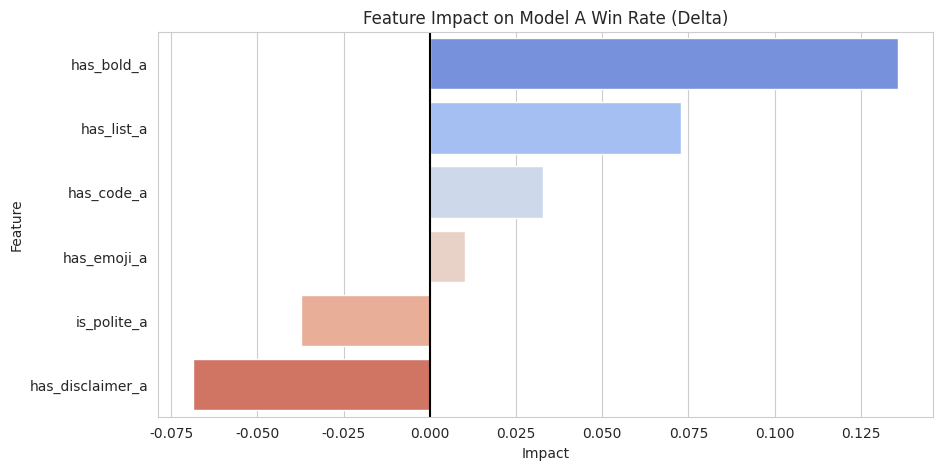


💡 [Length Bias]: In non-tie games, longer response wins: 61.47%

💡 [Refusal Penalty]: Model B Win Rate when ONLY A refuses: 45.35% (Baseline ~34%)


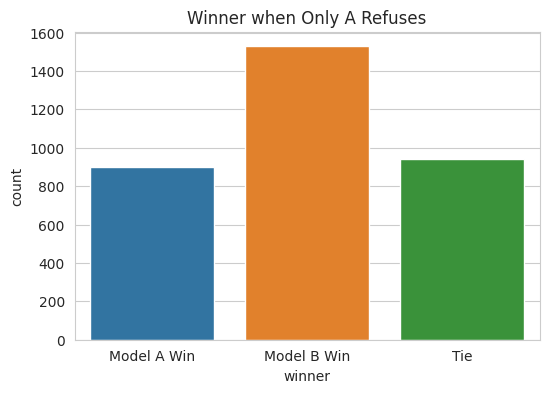


💡 [Readability]: Model A Win Rate by Complexity Diff
readability_bin
A Simpler    0.357172
Similar      0.340367
A Complex    0.356754
Name: winner_model_a, dtype: float64


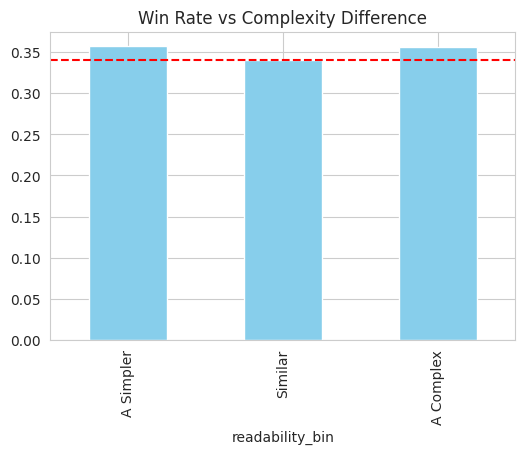


💡 [Double Refusal]: Count: 1792 | Tie Rate: 38.39%

💡 [Code Formatting]: In Code Tasks, A Win Rate:
   With Code Block: 37.82%
   No Code Block:   31.21%


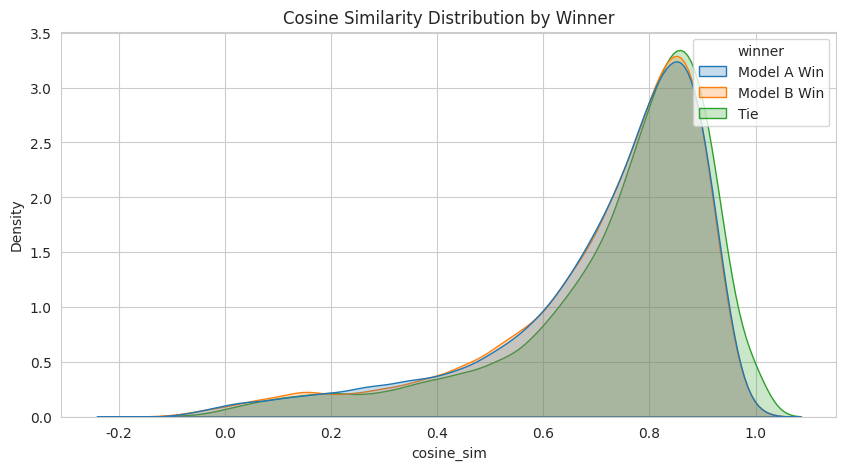


💡 [Similarity]: Tie Rate when Sim > 0.95: 59.51%


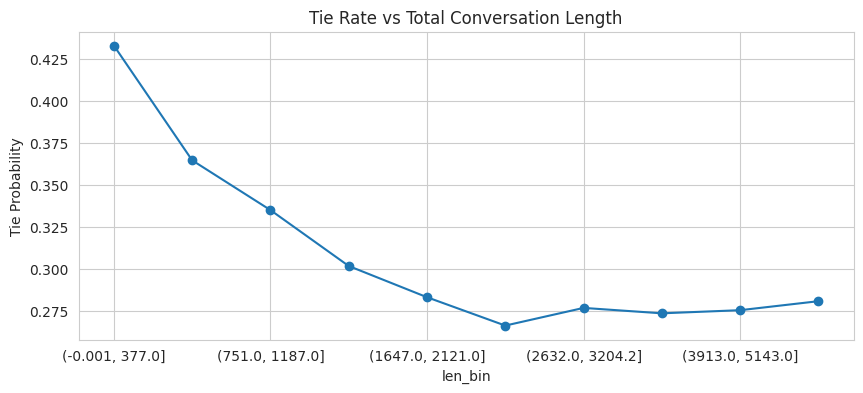

In [15]:
def analyze_and_plot(df):
    print("="*50)
    print("📊 Advanced Analysis Report (Full)")
    print("="*50)
    
    # 1. 风格特征影响 (Bar Plot)
    def calc_delta(feat):
        w_with = df[df[feat]==1]['winner_model_a'].mean()
        w_without = df[df[feat]==0]['winner_model_a'].mean()
        return w_with - w_without

    feats = ['has_bold_a', 'has_list_a', 'has_code_a', 'has_emoji_a', 'is_polite_a', 'has_disclaimer_a']
    deltas = {f: calc_delta(f) for f in feats}
    res_df = pd.DataFrame(list(deltas.items()), columns=['Feature', 'Impact']).sort_values('Impact', ascending=False)
    
    plt.figure(figsize=(10, 5))
    sns.barplot(x='Impact', y='Feature', data=res_df, palette='coolwarm')
    plt.title("Feature Impact on Model A Win Rate (Delta)")
    plt.axvline(0, color='k')
    plt.show()

    # 2. [Case 1] 长回答胜率
    longer_wins = df[((df['len_a'] > df['len_b']) & (df['winner_model_a'] == 1)) |
                     ((df['len_b'] > df['len_a']) & (df['winner_model_b'] == 1))].shape[0]
    # 排除平局样本计算胜率更准确
    non_tie_count = df[df['winner'] != 'Tie'].shape[0]
    print(f"\n💡 [Length Bias]: In non-tie games, longer response wins: {longer_wins / non_tie_count:.2%}")

    # 3. [Case 2] 拒答影响
    subset = df[(df['is_refusal_a'] == True) & (df['is_refusal_b'] == False)]
    if len(subset) > 0:
        print(f"\n💡 [Refusal Penalty]: Model B Win Rate when ONLY A refuses: {subset['winner_model_b'].mean():.2%} (Baseline ~34%)")
        plt.figure(figsize=(6, 4))
        sns.countplot(x='winner', data=subset, order=['Model A Win', 'Model B Win', 'Tie'])
        plt.title("Winner when Only A Refuses")
        plt.show()

    # 4. [Case 3] 可读性影响
    print(f"\n💡 [Readability]: Model A Win Rate by Complexity Diff")
    # 使用 pd.cut 分箱
    df['readability_bin'] = pd.cut(df['read_diff'], bins=[-50, -2, 2, 50], labels=['A Simpler', 'Similar', 'A Complex'])
    win_rates = df.groupby('readability_bin')['winner_model_a'].mean()
    print(win_rates)
    
    plt.figure(figsize=(6, 4))
    win_rates.plot(kind='bar', color='skyblue')
    plt.title("Win Rate vs Complexity Difference")
    plt.axhline(0.34, color='r', linestyle='--')
    plt.show()

    # 5. [Case 4] 双重拒答
    both_refuse = df[(df['is_refusal_a']==1) & (df['is_refusal_b']==1)]
    tie_rate_refuse = (both_refuse['winner'] == 'Tie').mean()
    print(f"\n💡 [Double Refusal]: Count: {len(both_refuse)} | Tie Rate: {tie_rate_refuse:.2%}")

    # 6. 代码任务中的 Markdown 影响
    code_subset = df[df['is_code_task']==1]
    if len(code_subset) > 0:
        win_code = code_subset[code_subset['has_code_a']==1]['winner_model_a'].mean()
        win_no = code_subset[code_subset['has_code_a']==0]['winner_model_a'].mean()
        print(f"\n💡 [Code Formatting]: In Code Tasks, A Win Rate:")
        print(f"   With Code Block: {win_code:.2%}")
        print(f"   No Code Block:   {win_no:.2%}")

    # 7. 相似度陷阱
    plt.figure(figsize=(10, 5))
    sns.kdeplot(data=df, x='cosine_sim', hue='winner', fill=True, common_norm=False)
    plt.title("Cosine Similarity Distribution by Winner")
    plt.show()
    
    high_sim_tie = df[df['cosine_sim'] > 0.95]['winner'].value_counts(normalize=True).get('Tie', 0)
    print(f"\n💡 [Similarity]: Tie Rate when Sim > 0.95: {high_sim_tie:.2%}")

    # 8. 长度与平局率 (len_sum 在这里用)
    # 使用 len_sum 进行分箱分析，但不放入训练特征
    df['len_bin'] = pd.qcut(df['len_sum'], q=10)
    tie_len = df.groupby('len_bin').apply(lambda x: (x['winner']=='Tie').mean())
    
    plt.figure(figsize=(10, 4))
    tie_len.plot(marker='o')
    plt.title("Tie Rate vs Total Conversation Length")
    plt.ylabel("Tie Probability")
    plt.show()
    
# --- Run Analysis ---
analyze_and_plot(train_df)

- 长回答偏好（42.48%）
    - 虽然看起来不到 50%，但要注意只有 ~69% 的样本是有胜负的。这意味着在有胜负的样本中，长回答获胜的概率显著高于短回答。这是一个强特征。
- 拒答惩罚（+12% win rate）
    - 当 A 拒答时，B 的胜率从基准的 34% 飙升到 46%。这证实了 is_refusal 是一个魔法特征 (Magic Feature)，必须加入模型输入。
- 相似度陷阱 (Tie Rate 57.14%)
    - 这是最强的发现！当余弦相似度 > 0.95 时，平局率从 31% 飙升到 57%。
    - 模型如果发现 A 和 B 只有微小的字面差异，应该倾向于预测 Tie。但剩下那 43% 非平局的样本是难样本 (Hard Samples)，通常涉及事实性错误或代码微小 Bug，这是上分的关键。

## 7. Visualization: Full Scale Clustering
基于 c-TF-IDF 的词云矩阵和 Plotly 散点图。

📊 Generating Cluster Insights for column: cluster_id_k12
Generating keywords for 12 clusters...


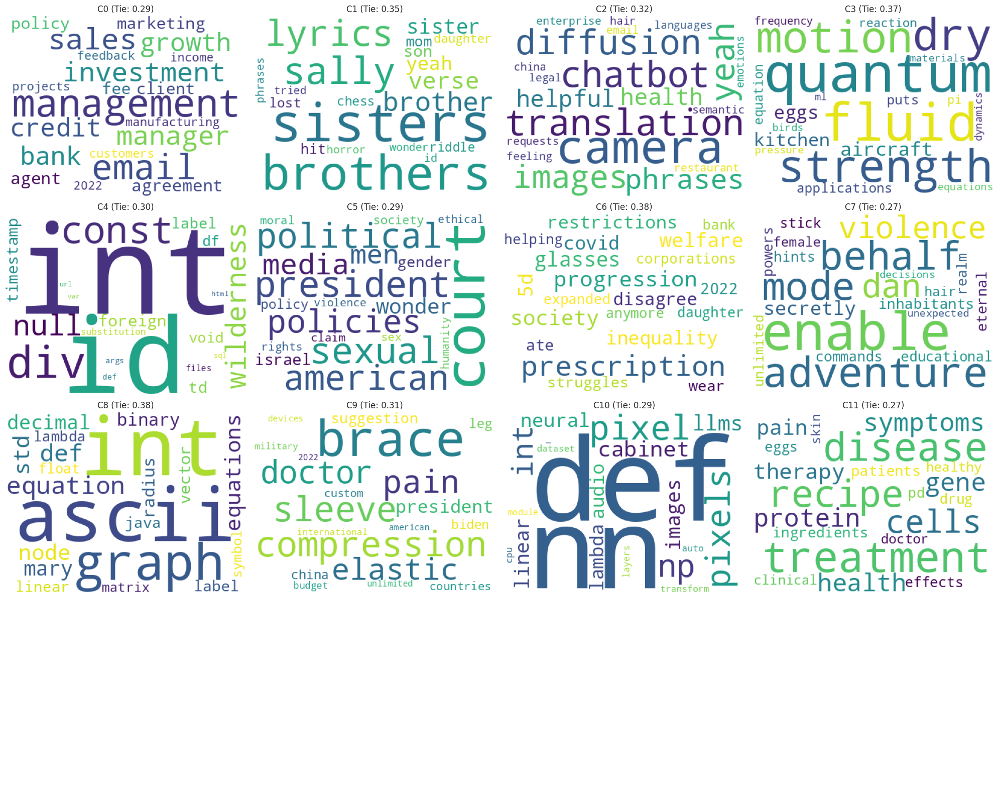

In [14]:
def visualize_clusters_full(df, target_col='cluster_id'):
    """
    Args:
        df: 数据集
        target_col: 指定要可视化的列名，默认 'cluster_id' (K=20)。
                    也可以传入 'cluster_id_k50' 查看细粒度聚类。
    """
    print("="*50)
    print(f"📊 Generating Cluster Insights for column: {target_col}")
    print("="*50)
    
    if target_col not in df.columns:
        print(f"❌ Column {target_col} not found in DataFrame!")
        return

    clean_df = df.copy()
    
    # 1. c-TF-IDF 关键词提取
    print(f"Generating keywords for {clean_df[target_col].nunique()} clusters...")
    
    # 注意这里 groupby 的是 target_col
    docs = clean_df.groupby(target_col)['prompt_text'].apply(lambda x: " ".join(x.fillna("").astype(str)))
    
    try:
        tfidf = TfidfVectorizer(stop_words='english', max_df=0.9, min_df=5, max_features=500, token_pattern=r"(?u)\b\w+\b")
        tfidf_mat = tfidf.fit_transform(docs)
    except ValueError:
        print("⚠️ TF-IDF Failed. Skipping WordClouds.")
        return

    vocab = tfidf.get_feature_names_out()
    dense = tfidf_mat.todense()
    
    keywords_map = {}
    keywords_dict_for_wc = {}
    cluster_tie_rates = df.groupby(target_col)['winner'].apply(lambda x: (x=='Tie').mean())
    
    for i, cluster_idx in enumerate(docs.index):
        row = dense[i].tolist()[0]
        top_ids = np.argsort(row)[::-1][:20]
        valid_ids = [idx for idx in top_ids if row[idx] > 0]
        
        kw_str = ", ".join([vocab[idx] for idx in valid_ids[:10]])
        keywords_map[cluster_idx] = kw_str
        keywords_dict_for_wc[cluster_idx] = {vocab[idx]: row[idx] for idx in valid_ids}

    # 2. 绘制词云矩阵
    n_clusters = len(keywords_map)
    cols = 4
    rows = (n_clusters // cols) + 1
    rows = min(rows, 15) # 限制行数
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    if n_clusters == 1: axes = [axes]
    else: axes = axes.flatten()
    
    for i, ax in enumerate(axes):
        if i < n_clusters:
            cluster_idx = list(keywords_map.keys())[i]
            wc_data = keywords_dict_for_wc.get(cluster_idx, {})
            if wc_data:
                wc = WordCloud(width=400, height=300, background_color='white').generate_from_frequencies(wc_data)
                tie_r = cluster_tie_rates.get(cluster_idx, 0)
                ax.imshow(wc)
                ax.set_title(f"C{cluster_idx} (Tie: {tie_r:.2f})")
            else:
                ax.text(0.5, 0.5, "No Data", ha='center')
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    # 3. Plotly Scatter
    # 创建临时列用于绘图，防止污染原始 df
    plot_df = df.sample(min(20000, len(df)), random_state=42).copy()
    plot_df['cluster_keywords'] = plot_df[target_col].map(keywords_map)
    plot_df['cluster_label'] = plot_df[target_col].astype(str)
    
    fig = px.scatter(
        plot_df, x='umap_x', y='umap_y',
        color='cluster_label',
        hover_data=['cluster_keywords', 'prompt_text', 'winner'],
        title=f'Cluster Visualization ({target_col})',
        template='plotly_white',
        opacity=0.6
    )
    fig.update_traces(marker=dict(size=3))
    fig.update_layout(showlegend=False)
    fig.show()

# --- Run Visualization (默认展示 cluster_id 即 K=20) ---
# visualize_clusters_full(train_df, target_col='cluster_id')

# 如果你想看 K=50 的细节，可以再运行一次：
visualize_clusters_full(train_df, target_col='cluster_id_k12')

## 8. Final Dataset Preparation
最后一步：整理数据，删除原始文本和 ID，保留模型可以直接使用的特征。

In [11]:
def save_split_datasets(df, save_dir='/kaggle/working/output'):
    import os
    os.makedirs(save_dir, exist_ok=True)
    
    print("💾 Saving Datasets...")
    
    # 1. 固定特征列表 (不包含 cluster_id，后面动态加)
    base_feature_cols = [
        'len_p', 'len_a', 'len_b', 'len_diff', "len_ratio",
        'expansion_a', 'expansion_b', 'expansion_diff',
        'cosine_sim', 'is_code_task',
        'has_code_a', 'has_code_b', 'code_diff',
        'has_bold_a', 'has_bold_b', 'bold_diff',
        'has_list_a', 'has_list_b', 'list_diff',
        'has_latex_a', 'has_latex_b',
        'has_emoji_a', 'has_emoji_b',
        'is_polite_a', 'is_polite_b',
        'has_disclaimer_a', 'has_disclaimer_b',
        'sentiment_a', 'sentiment_b', 'sentiment_gap',
        'is_refusal_a', 'is_refusal_b', 'refusal_diff', 'both_refuse',
        'read_a', 'read_b', 'read_diff',
        'code_task_x_has_code_a', 'code_task_x_has_code_b'
    ]
    
    target_cols = ['winner_model_a', 'winner_model_b', 'winner_tie']
    
    # [关键修改] 动态获取所有 Cluster 相关的列
    # 这会把 cluster_id, cluster_id_k10, cluster_id_k20... 全部抓进来
    cluster_cols = [c for c in df.columns if c.startswith('cluster_id')]
    print(f"   -> Found cluster columns to save: {cluster_cols}")
    
    # 合并特征列
    feature_cols = cluster_cols + base_feature_cols
    
    # 过滤掉 DataFrame 中实际不存在的列 (防止报错)
    valid_feats = [c for c in feature_cols if c in df.columns]
    missing_feats = set(feature_cols) - set(valid_feats)
    if missing_feats:
        print(f"⚠️ Warning: The following features were skipped: {missing_feats}")
    
    # --- 1. 保存结构化数据 ---
    struct_cols = valid_feats + target_cols
    struct_df = df[struct_cols].copy().fillna(0)
    
    # 保存 CSV
    struct_csv_path = os.path.join(save_dir, 'train_features_structured.csv')
    struct_df.to_csv(struct_csv_path, index=False)
    print(f"   -> Structured Data CSV saved to {struct_csv_path}")
    
    # 保存 Parquet
    struct_parquet_path = os.path.join(save_dir, 'train_features_structured.parquet')
    struct_df.to_parquet(struct_parquet_path, index=False)
    print(f"   -> Structured Data Parquet saved to {struct_parquet_path}")
    
    # --- 2. 保存文本数据 (给 LLM 微调) ---
    # 文本数据我们也把 cluster_id 带上 (通常带默认的那个 cluster_id 就够了，全带上也行)
    text_candidates = ['prompt_text', 'res_a_text', 'res_b_text'] + cluster_cols
    valid_text_cols = [c for c in text_candidates if c in df.columns]
    
    llm_df = df[valid_text_cols + target_cols].copy()
    
    llm_path = os.path.join(save_dir, 'train_text_finetuning.csv')
    llm_df.to_csv(llm_path, index=False, escapechar='\\')
    print(f"   -> LLM Data CSV saved to {llm_path}")

# --- 执行 ---
save_split_datasets(train_df)

💾 Saving Datasets...
   -> Structured Data CSV saved to /kaggle/working/output/train_features_structured.csv
   -> Structured Data Parquet saved to /kaggle/working/output/train_features_structured.parquet
   -> LLM Data CSV saved to /kaggle/working/output/train_text_finetuning.csv


数据清洗

In [ ]:
def clean_features_final(df):
    # 1. 删除重复列
    if 'cluster_id' in df.columns:
        df = df.drop(columns=['cluster_id'])
    
    # 2. 转换 Cluster 列为 Category 类型 (给 LightGBM 用)
    cluster_cols = [c for c in df.columns if c.startswith('cluster_id_k')]
    for c in cluster_cols:
        df[c] = df[c].astype('category')
        
    # 3. 处理无限值 (Infinity)
    # 将 inf 替换为该列的最大值，-inf 替换为最小值
    num_cols = df.select_dtypes(include=[np.number]).columns
    for c in num_cols:
        df[c] = df[c].replace([np.inf, -np.inf], np.nan) # 先转 NaN
        df[c] = df[c].fillna(0) # 再填 0 (或者均值)
        
    print(f"✅ Features Cleaned. Retained clusters: {cluster_cols}")
    return df

# 加载 -> 清洗 -> 覆盖保存
df = pd.read_parquet("output/train_features_structured.parquet")
df = clean_features_final(df)
df.to_parquet("output/train_features_structured.parquet", index=False)

df = pd.read_csv("output/train_features_structured.csv")
df = clean_features_final(df)
df.to_csv("output/train_features_structured.csv", index=False)

df = pd.read_csv("output/train_text_finetuning.csv")
df = clean_features_final(df)
df.to_csv("output/train_text_finetuning.csv", index=False)